<ipython-input-2-98b09467d383>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv('nifty_ohlc_data.csv',


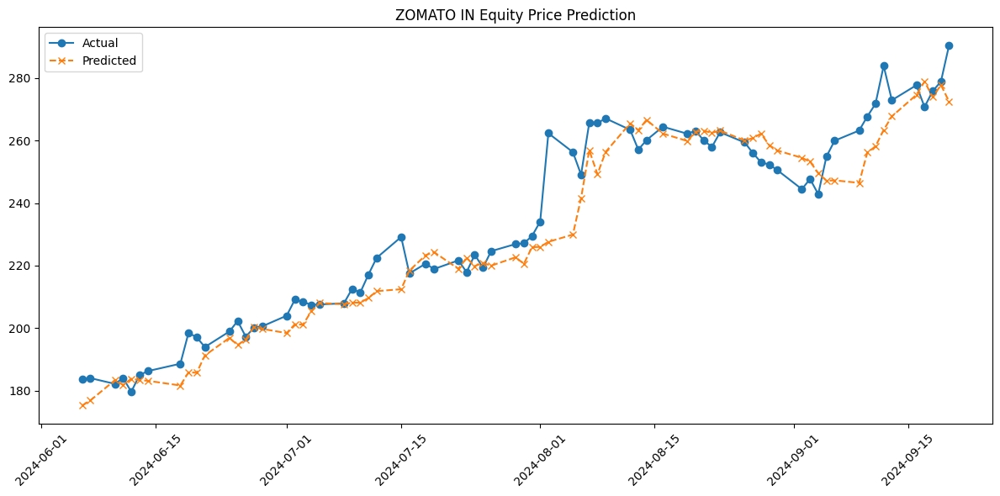

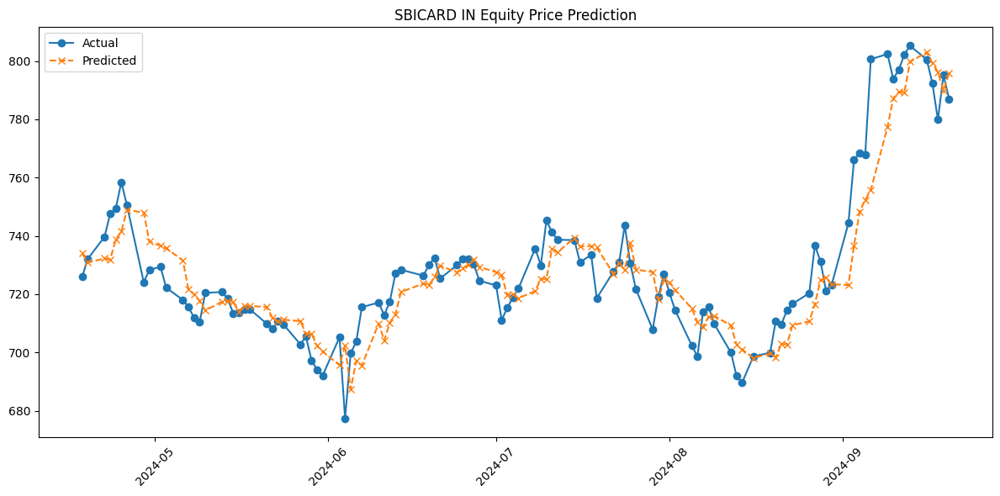

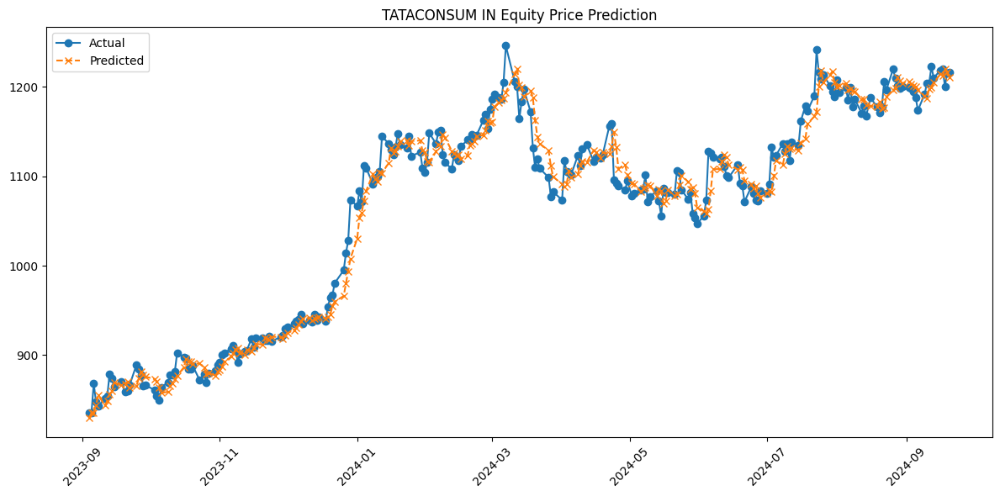

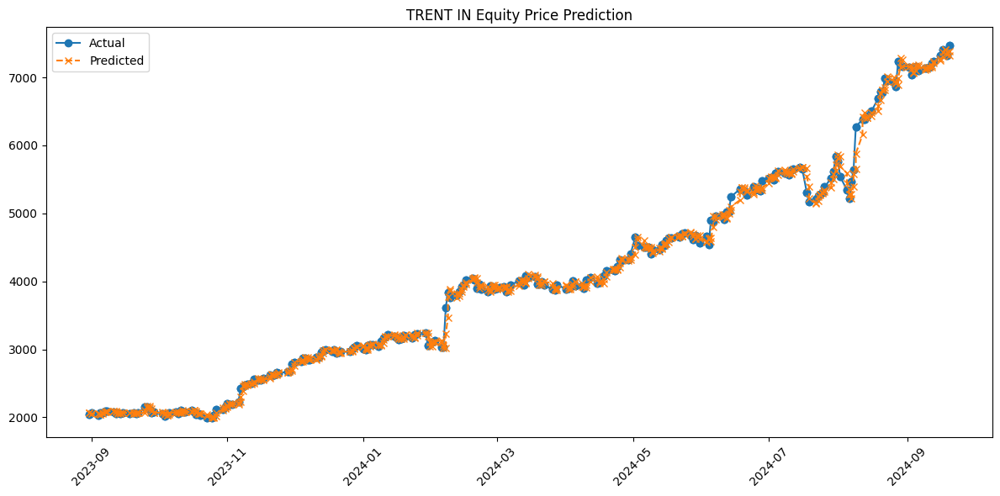

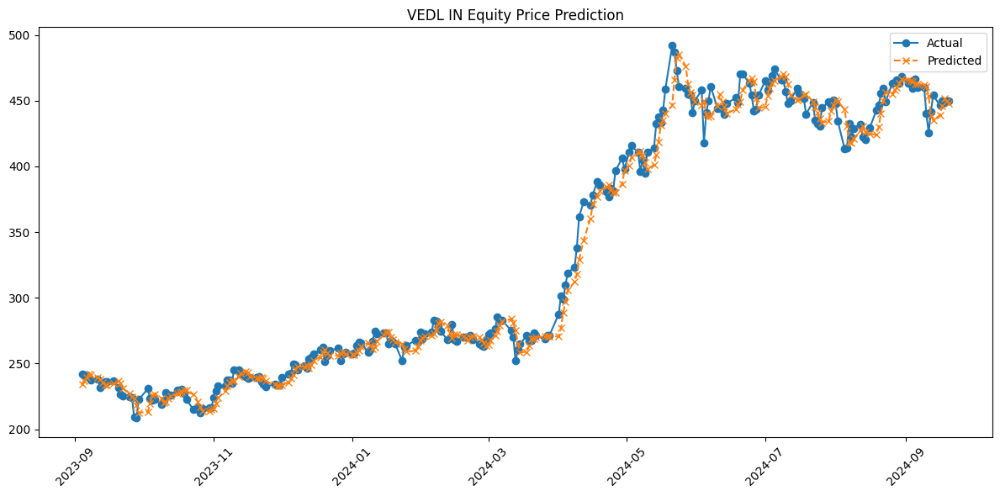

...

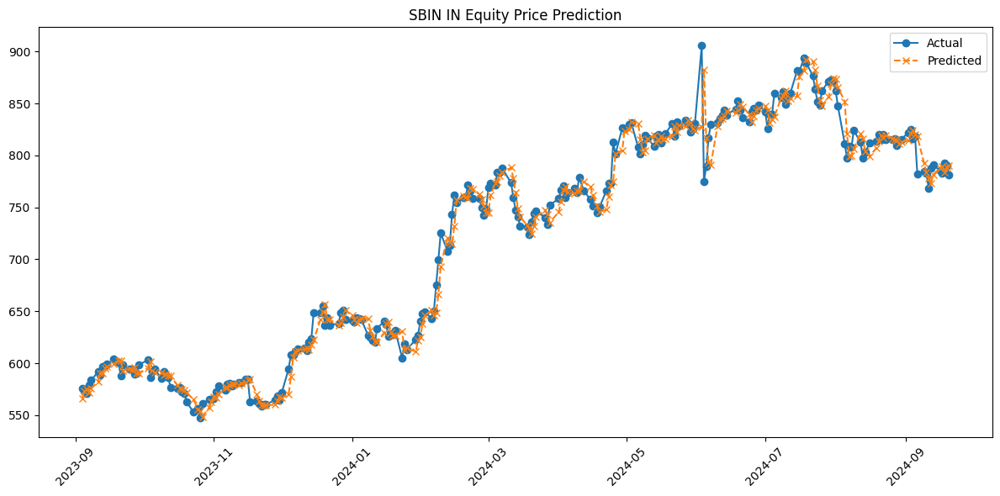

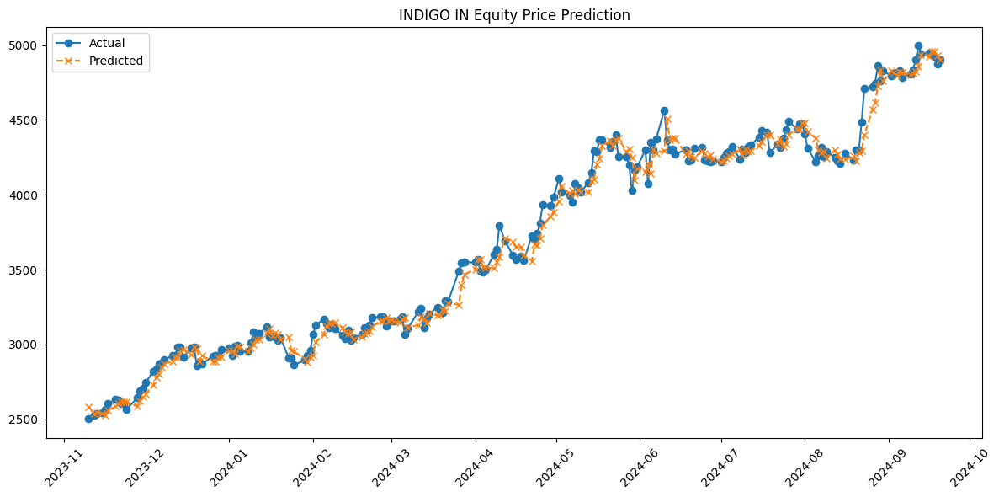

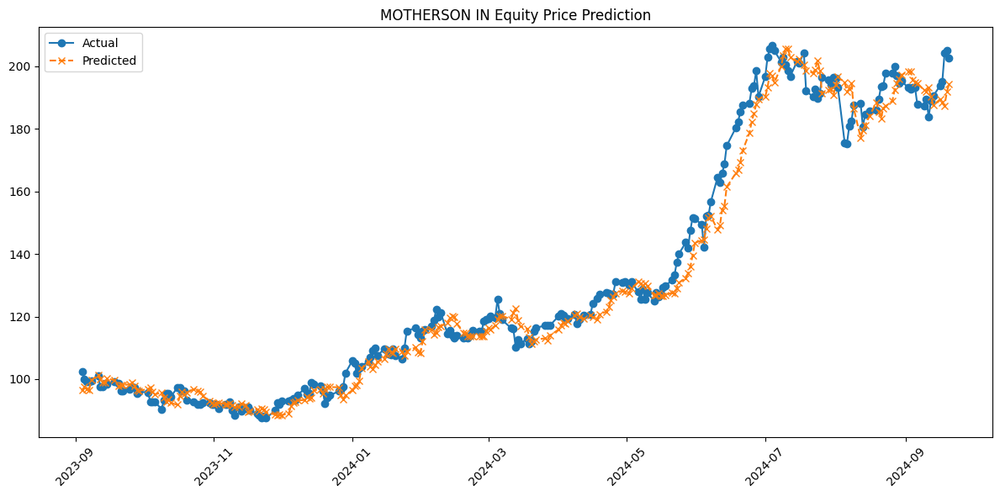

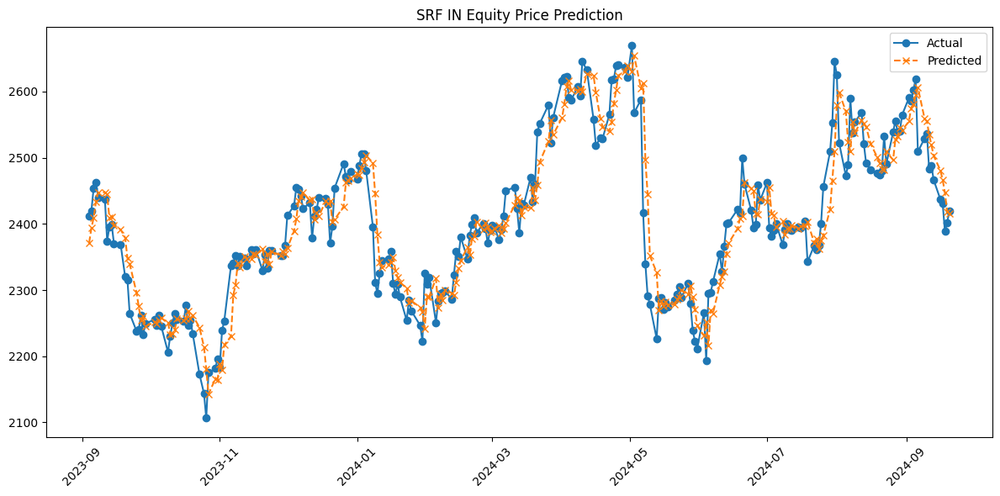

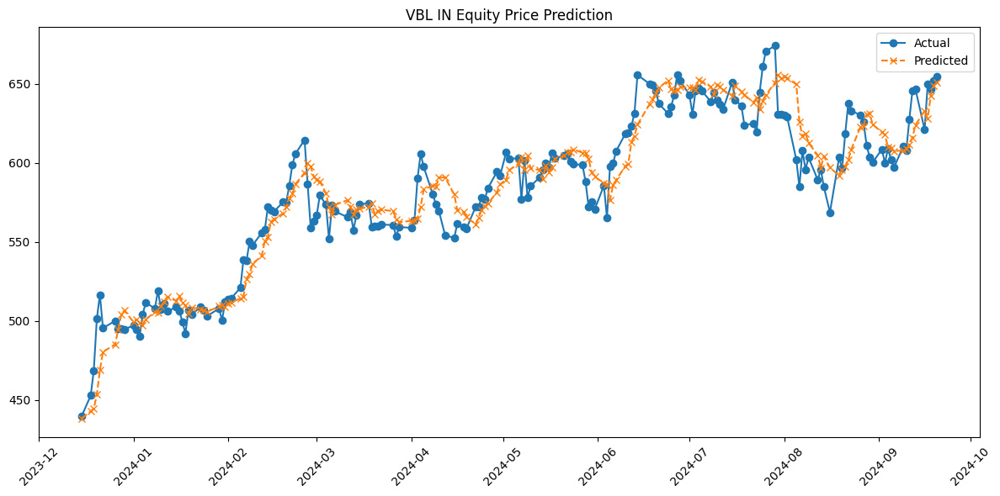

+----------------------+--------------------+--------------------+--------------------+
|       Company        |        MAE         |        MSE         |        RMSE        |
+----------------------+--------------------+--------------------+--------------------+
|   ZOMATO IN Equity   | 6.615208625793457  | 81.26350402832031  | 9.014627226254024  |
|  SBICARD IN Equity   | 8.414999961853027  | 123.75442504882812 | 11.124496620019627 |
| TATACONSUM IN Equity | 13.729622840881348 | 338.06768798828125 | 18.386617089292997 |
|   TRENT IN Equity    | 49.737205505371094 |   7041.919921875   | 83.91614815918925  |
|    VEDL IN Equity    | 7.2008209228515625 | 98.67459869384766  | 9.933508881248743  |
|   DMART IN Equity    | 86.30621337890625  |  13158.333984375   | 114.70978155490926 |
|    IGL IN Equity     | 7.151413917541504  | 103.58731079101562 | 10.177785161370602 |
|    ITC IN Equity     | 3.3099541664123535 | 20.77382469177246  | 4.557831139014747  |
|    ATGL IN Equity    | 13.8438

In [2]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tabulate import tabulate

# Load data with explicit date format
try:
    df = pd.read_csv('nifty_ohlc_data.csv',
                    parse_dates=['date'],
                    format='%m/%d/%y')  # Adjust format as per your CSV
except:
    df = pd.read_csv('nifty_ohlc_data.csv',
                    parse_dates=['date'])

companies = df['security'].unique()

# Hyperparameters
p = 5  # Autoregressive order (AR(p))
num_epochs = 1000
learning_rate = 0.01

def create_lagged_data(data, p):
    """Create lagged features using vectorized operations"""
    n_samples = len(data) - p
    X = np.zeros((n_samples, p), dtype=np.float32)
    for i in range(n_samples):
        X[i] = data[i:i+p]
    y = data[p:].astype(np.float32)
    return torch.from_numpy(X), torch.from_numpy(y)

# Table to store error metrics
error_table = []

for company in companies:
    company_data = df[df['security'] == company].sort_values('date')
    if len(company_data) < p + 1:
        print(f"Skipping {company}: Insufficient data")
        continue

    prices = company_data['close'].values.astype(np.float32)
    split = int(len(prices) * 0.9)

    # Split data ensuring minimum length
    if split < p or (len(prices) - split) < 1:
        print(f"Skipping {company}: Not enough data after split")
        continue

    train_data = prices[:split]
    test_data = prices[split:]

    # Create lagged datasets
    X_train, y_train = create_lagged_data(train_data, p)
    X_test, y_test = create_lagged_data(test_data, p)

    if len(X_test) == 0:
        print(f"Skipping {company}: No test data after lagging")
        continue

    # Model setup
    model = nn.Linear(p, 1)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()

    # Training loop
    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train.view(-1, 1))
        loss.backward()
        optimizer.step()

    # Prediction
    with torch.no_grad():
        test_preds = model(X_test).squeeze().numpy()

    # Calculate error metrics
    mae = mean_absolute_error(y_test, test_preds)
    mse = mean_squared_error(y_test, test_preds)
    rmse = np.sqrt(mse)

    # Store metrics for the table
    error_table.append([company, mae, mse, rmse])

    # Plotting
    test_dates = company_data['date'].iloc[split+p:].values
    plt.figure(figsize=(12, 6))
    plt.plot(test_dates, y_test.numpy(), label='Actual', marker='o')
    plt.plot(test_dates, test_preds, label='Predicted', linestyle='--', marker='x')
    plt.title(f'{company} Price Prediction')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Print error metrics table
print(tabulate(error_table, headers=["Company", "MAE", "MSE", "RMSE"], tablefmt="pretty"))

<ipython-input-3-072a93525bf1>:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv('nifty_ohlc_data.csv',


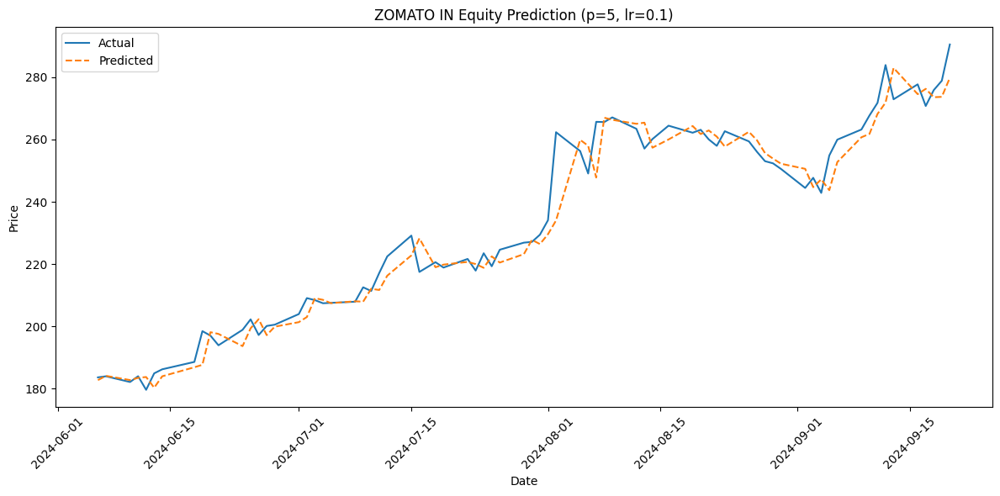

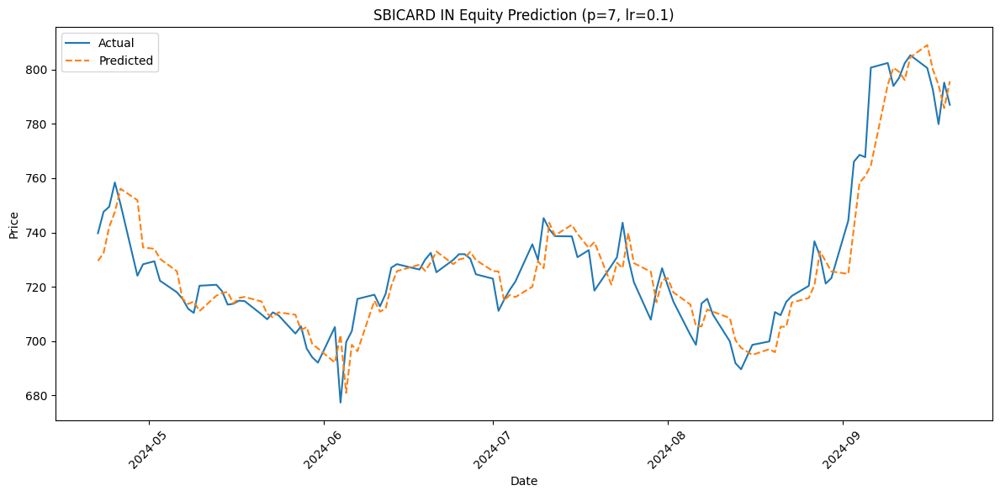

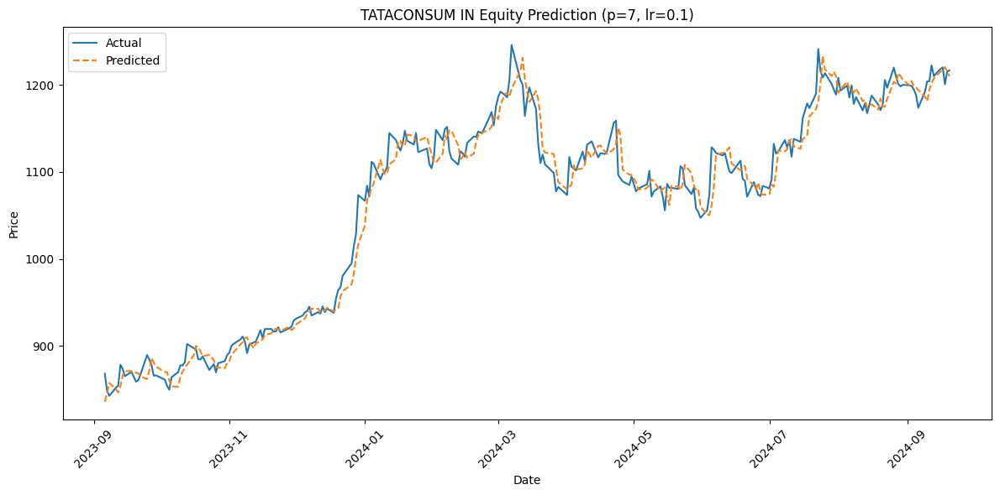

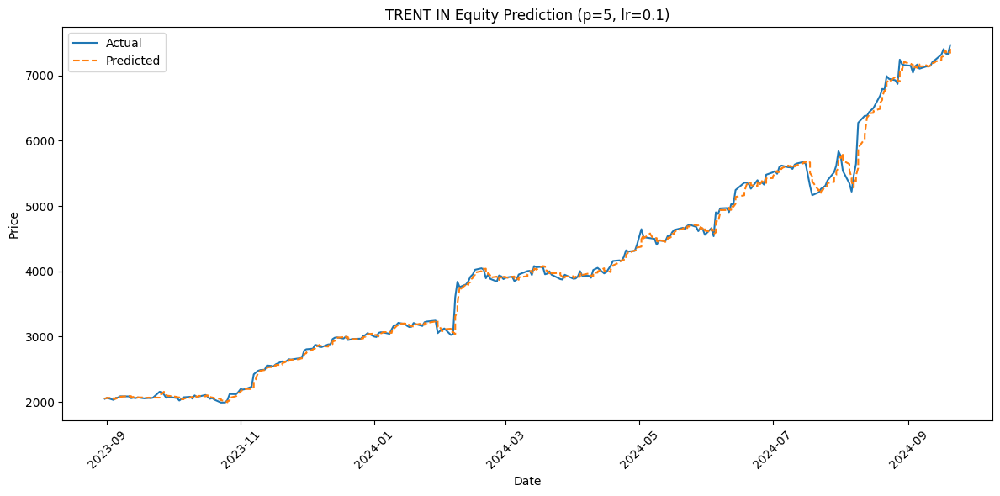

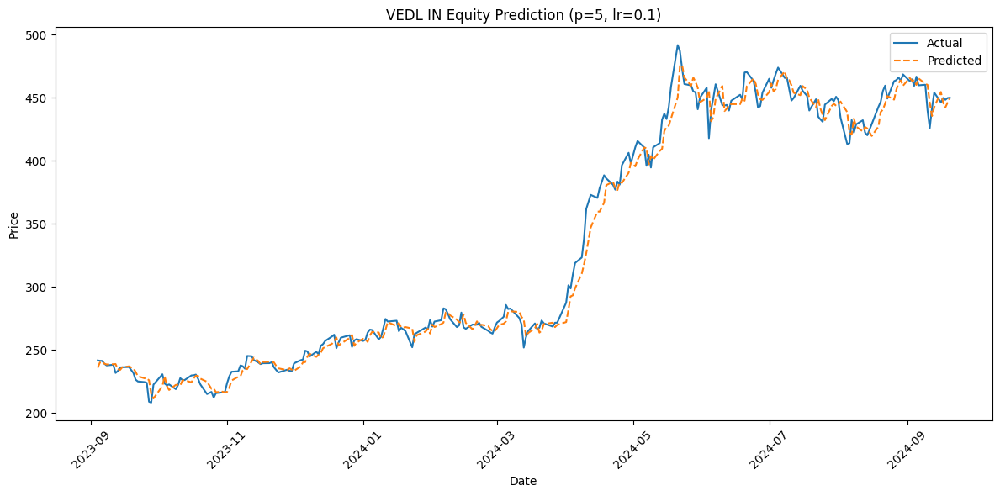

...

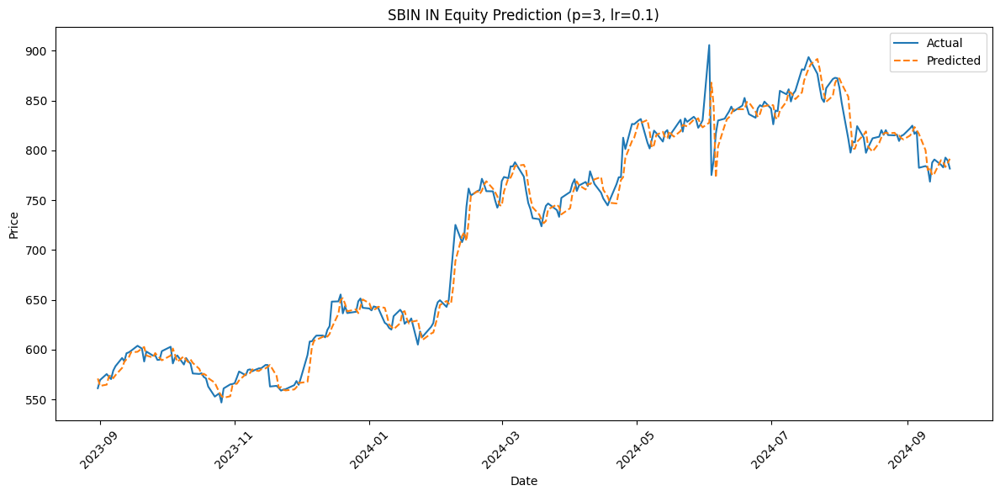

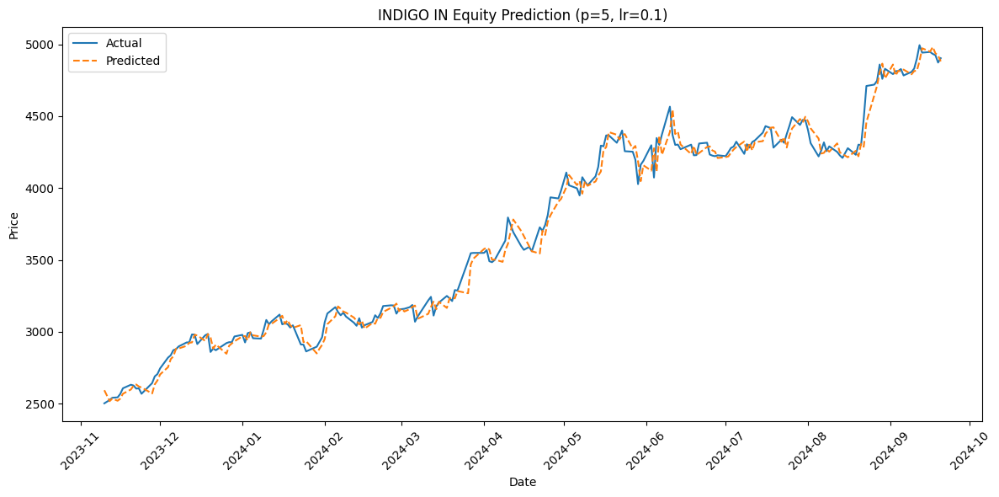

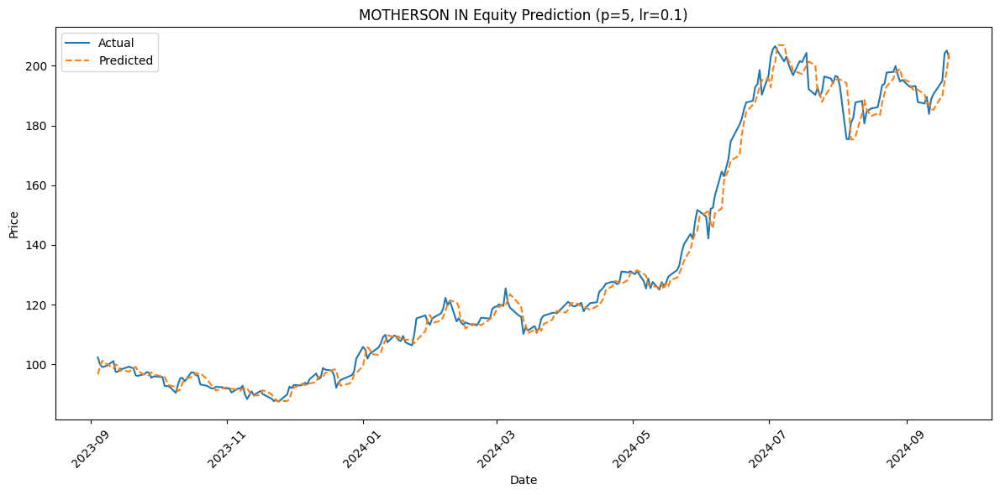

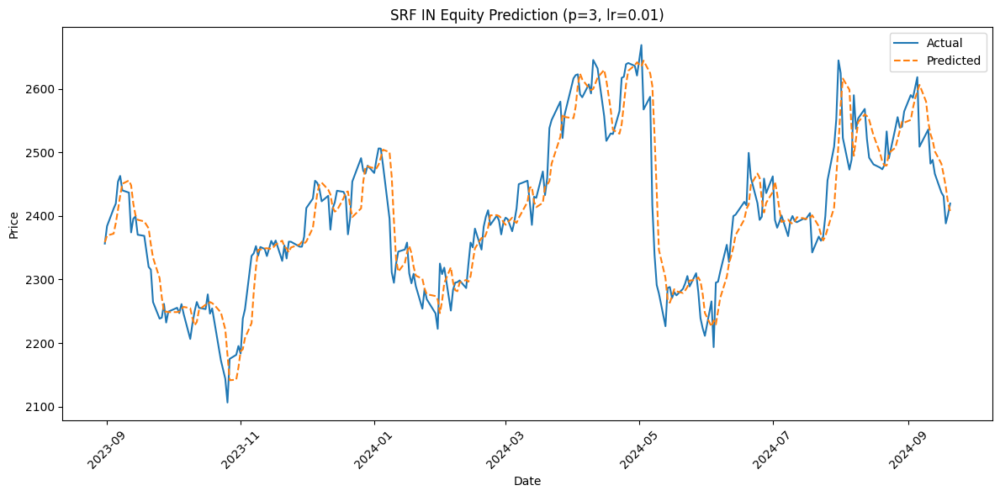

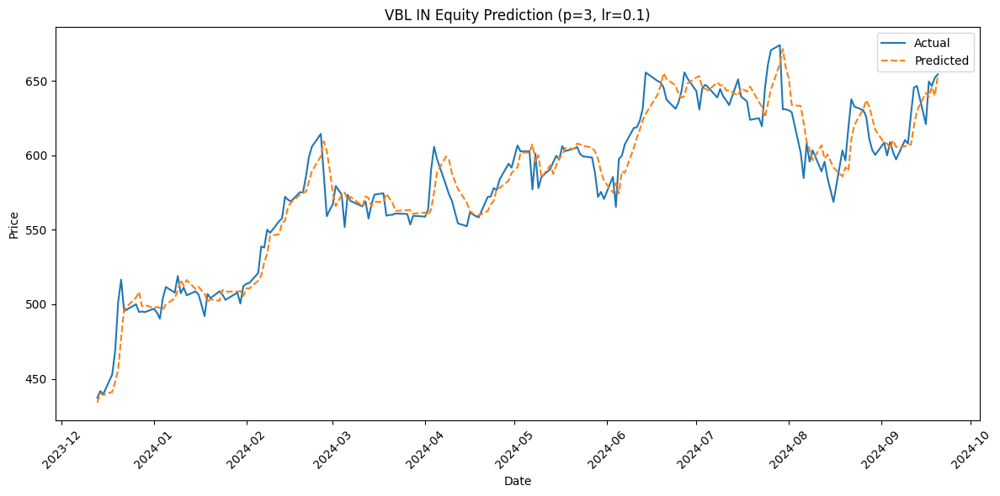

+----------------------+--------+---------+--------------------+--------------------+--------------------+
|       Company        | Best p | Best LR |        MAE         |        MSE         |        RMSE        |
+----------------------+--------+---------+--------------------+--------------------+--------------------+
|   ZOMATO IN Equity   |   5    |   0.1   | 4.310805320739746  | 37.45158767700195  | 6.119770230735951  |
|  SBICARD IN Equity   |   7    |   0.1   | 7.179442882537842  | 93.68740844726562  |  9.67922561196223  |
| TATACONSUM IN Equity |   7    |   0.1   | 13.299357414245605 | 318.1783142089844  | 17.837553481601237 |
|   TRENT IN Equity    |   5    |   0.1   | 50.555973052978516 |  7638.94970703125  | 87.40108527376104  |
|    VEDL IN Equity    |   5    |   0.1   | 6.703621864318848  | 86.76055145263672  | 9.314534419531483  |
|   DMART IN Equity    |   5    |   0.1   | 63.731143951416016 |  7853.7705078125   | 88.62150138545668  |
|    IGL IN Equity     |   5    |   0

In [3]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tabulate import tabulate

# Load data with explicit date format
try:
    df = pd.read_csv('nifty_ohlc_data.csv',
                    parse_dates=['date'],
                    format='%m/%d/%y')  # Adjust format as per your CSV
except:
    df = pd.read_csv('nifty_ohlc_data.csv',
                    parse_dates=['date'])

companies = df['security'].unique()

# Hyperparameter grid
p_values = [3, 5, 7]          # AR order candidates
learning_rates = [0.001, 0.01, 0.1]
num_epochs = 1000
patience = 50                  # Early stopping patience

def create_lagged_data(data, p):
    """Create lagged features using vectorized operations"""
    n_samples = len(data) - p
    X = np.zeros((n_samples, p), dtype=np.float32)
    for i in range(n_samples):
        X[i] = data[i:i+p]
    y = data[p:].astype(np.float32)
    return torch.from_numpy(X), torch.from_numpy(y)

error_table = []

for company in companies:
    company_data = df[df['security'] == company].sort_values('date')
    if len(company_data) < 10:  # Minimum data requirement
        print(f"Skipping {company}: Insufficient data")
        continue

    prices = company_data['close'].values.astype(np.float32)
    split = int(len(prices) * 0.9)

    # Split data
    train_data = prices[:split]
    test_data = prices[split:]

    # Further split train into subtrain/validation
    val_split = int(len(train_data) * 0.8)
    subtrain = train_data[:val_split]
    val_data = train_data[val_split:]

    best_params = {'p': None, 'lr': None, 'val_loss': float('inf')}

    # Hyperparameter grid search
    for p in p_values:
        if len(subtrain) < p or len(val_data) < p:
            continue

        # Create lagged datasets
        X_sub, y_sub = create_lagged_data(subtrain, p)
        X_val, y_val = create_lagged_data(val_data, p)

        if len(X_sub) == 0 or len(X_val) == 0:
            continue

        for lr in learning_rates:
            # Model setup
            model = nn.Linear(p, 1)
            optimizer = optim.Adam(model.parameters(), lr=lr)
            criterion = nn.MSELoss()

            # Training with early stopping
            best_loss = float('inf')
            no_improve = 0

            for epoch in range(num_epochs):
                optimizer.zero_grad()
                outputs = model(X_sub)
                loss = criterion(outputs, y_sub.view(-1, 1))
                loss.backward()
                optimizer.step()

                # Validation
                with torch.no_grad():
                    val_pred = model(X_val)
                    val_loss = criterion(val_pred, y_val.view(-1, 1)).item()

                # Early stopping check
                if val_loss < best_loss:
                    best_loss = val_loss
                    no_improve = 0
                else:
                    no_improve += 1

                if no_improve >= patience:
                    break

            # Track best parameters
            if best_loss < best_params['val_loss']:
                best_params.update({'p': p, 'lr': lr, 'val_loss': best_loss})

    # Skip if no valid params found
    if best_params['p'] is None:
        print(f"Skipping {company}: No valid hyperparameters found")
        continue

    # Final training with best params
    p_final = best_params['p']
    lr_final = best_params['lr']

    # Prepare full training data with best p
    X_train_full, y_train_full = create_lagged_data(train_data, p_final)
    X_test_final, y_test_final = create_lagged_data(test_data, p_final)

    if len(X_test_final) == 0:
        print(f"Skipping {company}: No test data after lagging")
        continue

    # Train final model
    final_model = nn.Linear(p_final, 1)
    optimizer = optim.Adam(final_model.parameters(), lr=lr_final)
    criterion = nn.MSELoss()

    for epoch in range(num_epochs):
        optimizer.zero_grad()
        outputs = final_model(X_train_full)
        loss = criterion(outputs, y_train_full.view(-1, 1))
        loss.backward()
        optimizer.step()

    # Prediction
    with torch.no_grad():
        test_preds = final_model(X_test_final).squeeze().numpy()

    # Calculate metrics
    mae = mean_absolute_error(y_test_final, test_preds)
    mse = mean_squared_error(y_test_final, test_preds)
    rmse = np.sqrt(mse)

    error_table.append([company, p_final, lr_final, mae, mse, rmse])

    # Plotting
    test_dates = company_data['date'].iloc[split+p_final:].values
    plt.figure(figsize=(12, 6))
    plt.plot(test_dates, y_test_final.numpy(), label='Actual')
    plt.plot(test_dates, test_preds, label='Predicted', linestyle='--')
    # plt.plot(test_dates, y_test.numpy(), label='Actual', marker='o')
    # plt.plot(test_dates, test_preds, label='Predicted', linestyle='--', marker='x')
    plt.title(f'{company} Prediction (p={p_final}, lr={lr_final})')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Print error table
headers = ["Company", "Best p", "Best LR", "MAE", "MSE", "RMSE"]
print(tabulate(error_table, headers=headers, tablefmt="pretty", floatfmt=".4f"))

In [7]:
!pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 26.1 MB/s eta 0:00:00


In [10]:
!pip uninstall numpy pmdarima -y
!pip install --no-cache-dir numpy==1.24.3 pmdarima==2.0.3

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
Found existing installation: pmdarima 2.0.4
Uninstalling pmdarima-2.0.4:
  Successfully uninstalled pmdarima-2.0.4
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 96.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 166.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
blosc2 3.2.0 requires numpy>=1.26, but you have numpy 1.24.3 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.3 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.24.3 which is incompatible.
albucore 0.0.23 requires numpy>=1.24.4, but you have numpy 1.24.3 which is incompatible.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.3 which is incompatible.
treescope 0

In [2]:
!pip install pmdarima==2.0.3 scikit-learn==1.3.2 statsmodels==0.14.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 27.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 38.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.14.4
    Uninstalling statsmodels-0.14.4:
      Successfully uninstalled statsmodels-0.14.4
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.1
    Uninstalling scikit-learn-1.6.1:
      Successfully uninstalled scikit-learn-1.6.1


<ipython-input-1-6993c5e541ae>:65: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv('nifty_ohlc_data.csv', parse_dates=['date'])



Best model:  ARIMA(2,1,0)(1,0,1)[5] intercept
Total fit time: 68.478 seconds

Best model:  ARIMA(2,1,0)(1,0,1)[5] intercept
Total fit time: 59.068 seconds

Best model:  ARIMA(2,1,0)(1,0,1)[5] intercept
Total fit time: 62.088 seconds


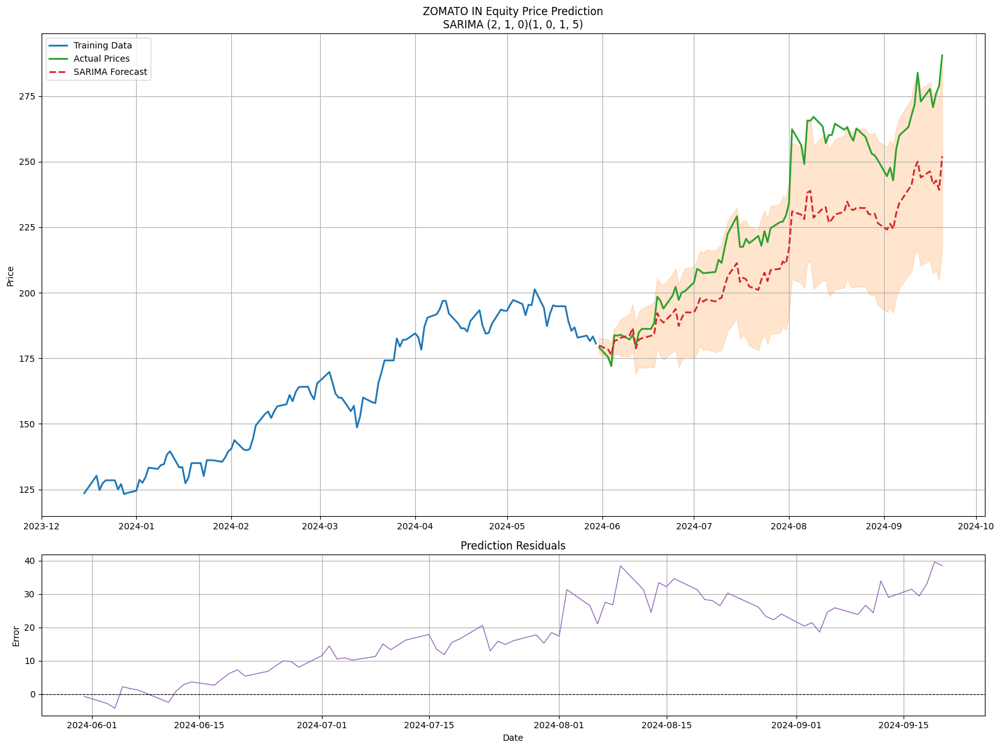


Best model:  ARIMA(3,1,1)(0,0,1)[5] intercept
Total fit time: 111.782 seconds

Best model:  ARIMA(3,1,1)(0,0,1)[5] intercept
Total fit time: 108.086 seconds

Best model:  ARIMA(3,1,1)(0,0,1)[5] intercept
Total fit time: 108.781 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


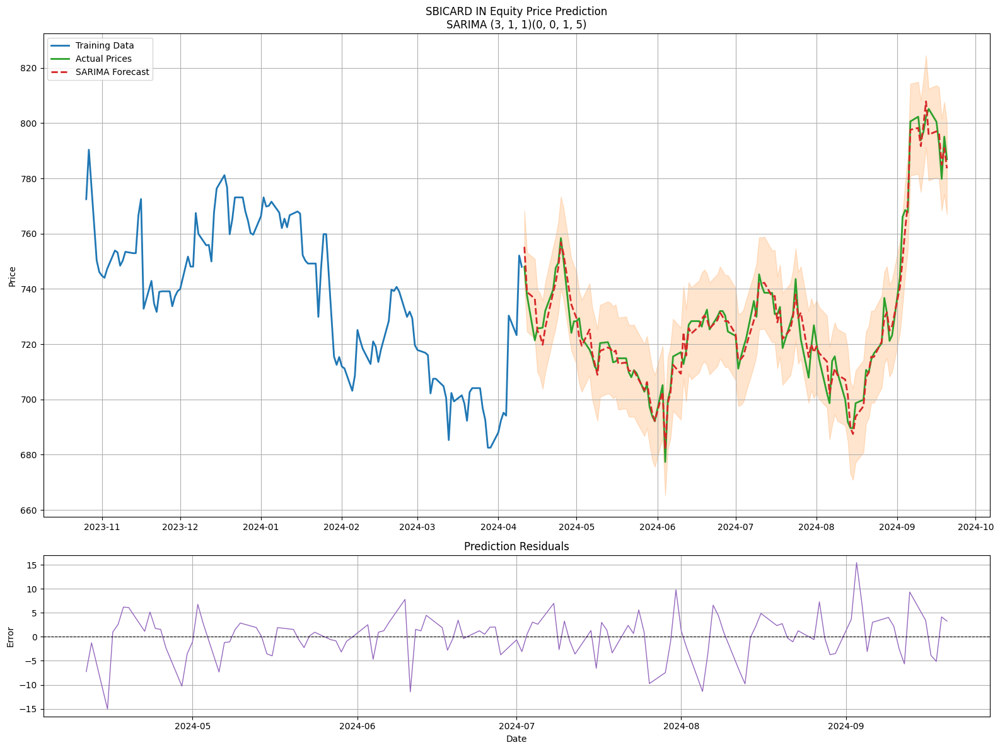


Best model:  ARIMA(0,1,1)(1,0,0)[5] intercept
Total fit time: 181.704 seconds

Best model:  ARIMA(0,1,1)(1,0,0)[5] intercept
Total fit time: 180.060 seconds

Best model:  ARIMA(0,1,1)(1,0,0)[5] intercept
Total fit time: 181.772 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


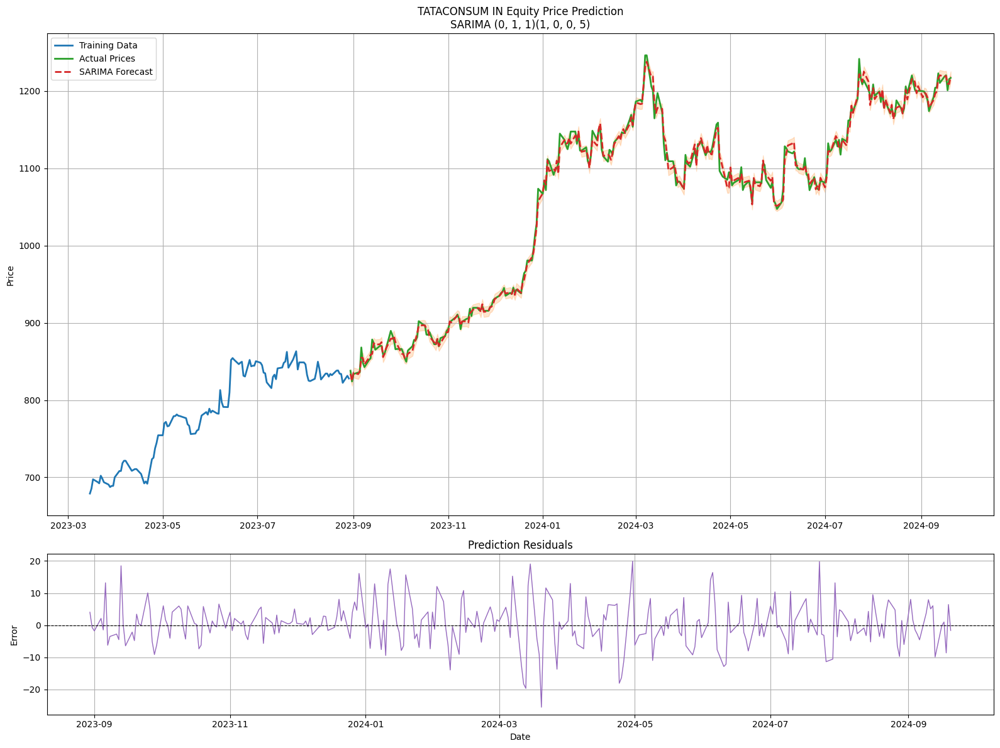

Failed for TRENT IN Equity: cannot reindex on an axis with duplicate labels

Best model:  ARIMA(0,1,0)(0,0,0)[5] intercept
Total fit time: 153.375 seconds

Best model:  ARIMA(0,1,0)(0,0,0)[5] intercept
Total fit time: 155.696 seconds

Best model:  ARIMA(0,1,0)(0,0,0)[5] intercept
Total fit time: 159.455 seconds


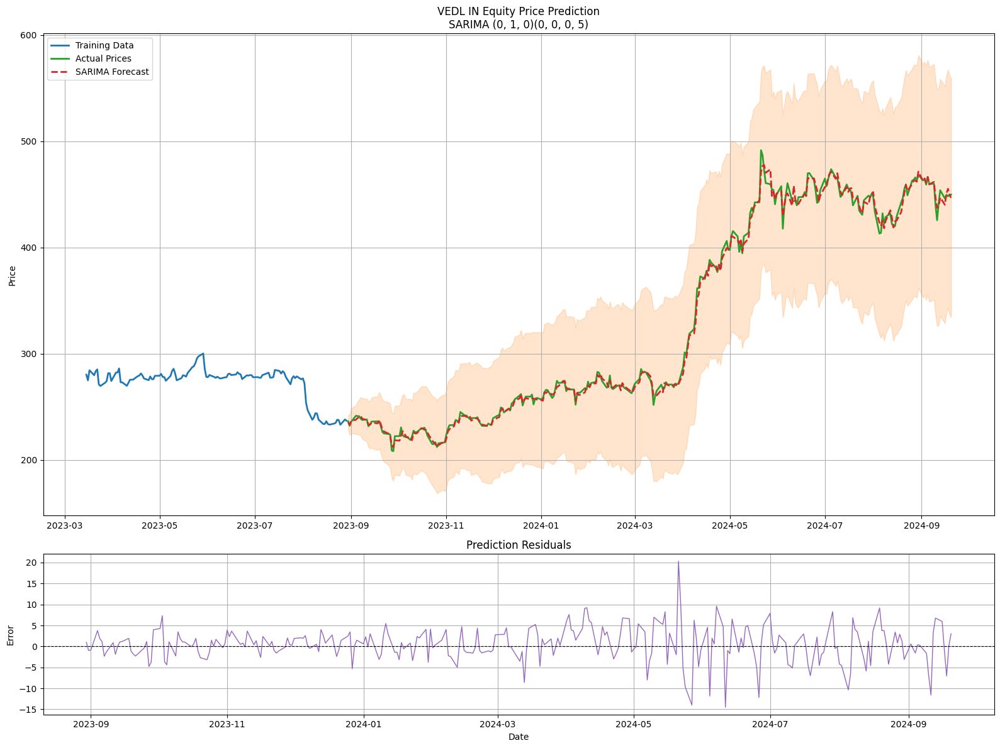


Best model:  ARIMA(2,1,2)(1,0,0)[5] intercept
Total fit time: 161.097 seconds

Best model:  ARIMA(2,1,2)(1,0,0)[5] intercept
Total fit time: 160.831 seconds

Best model:  ARIMA(2,1,2)(1,0,0)[5] intercept
Total fit time: 161.635 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


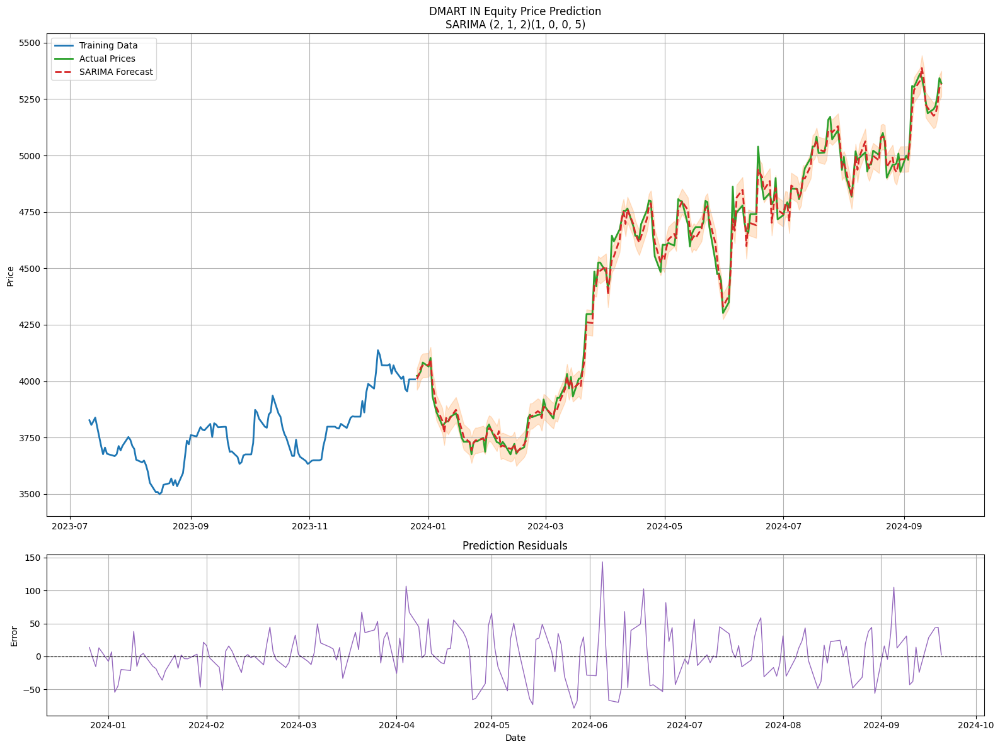


Best model:  ARIMA(0,1,0)(0,0,1)[5] intercept
Total fit time: 191.055 seconds

Best model:  ARIMA(0,1,0)(0,0,1)[5] intercept
Total fit time: 191.148 seconds

Best model:  ARIMA(0,1,0)(0,0,1)[5] intercept
Total fit time: 191.296 seconds


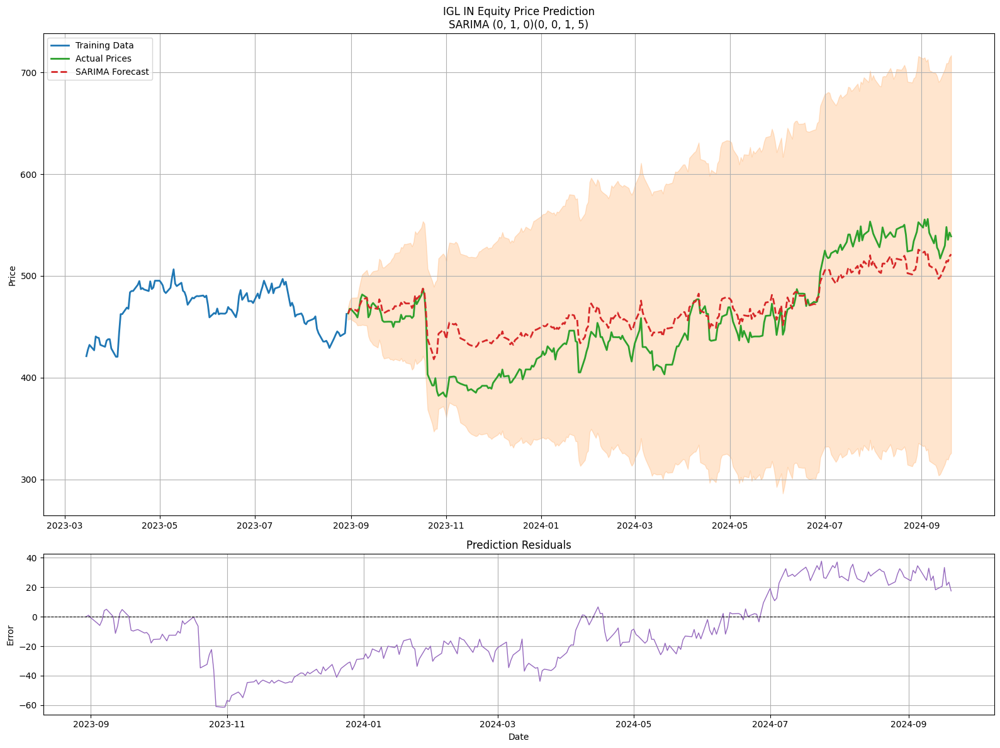

Failed for ITC IN Equity: cannot reindex on an axis with duplicate labels

Best model:  ARIMA(1,1,1)(1,0,0)[5] intercept
Total fit time: 128.489 seconds

Best model:  ARIMA(1,1,1)(1,0,0)[5] intercept
Total fit time: 129.230 seconds

Best model:  ARIMA(1,1,1)(1,0,0)[5] intercept
Total fit time: 130.091 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


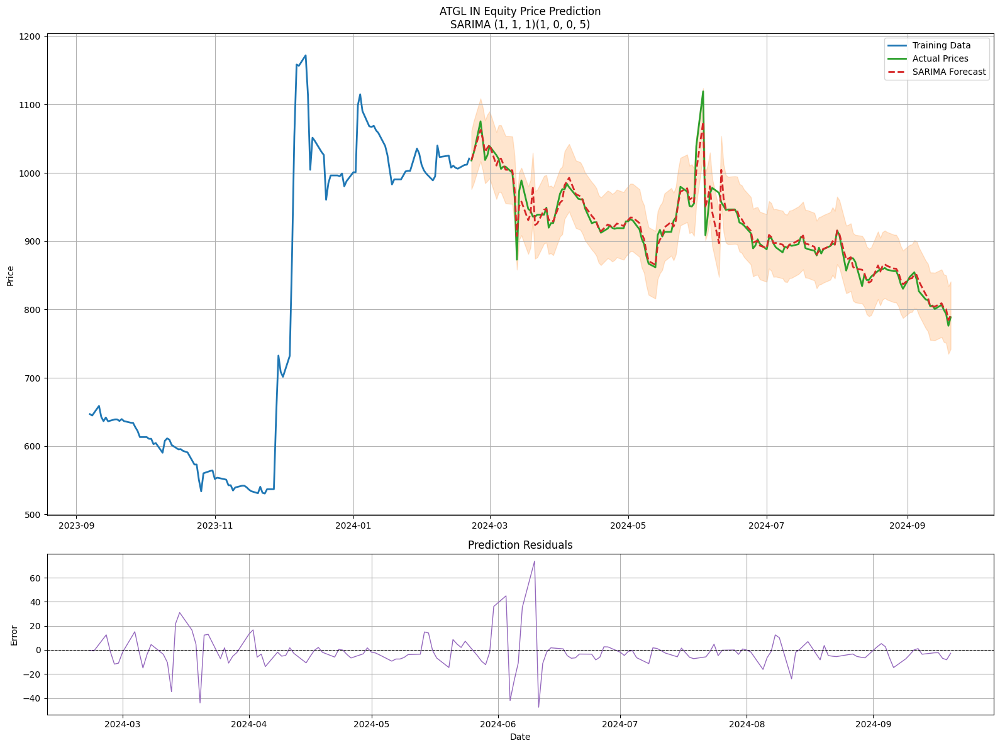


Best model:  ARIMA(2,1,0)(0,0,1)[5] intercept
Total fit time: 52.632 seconds

Best model:  ARIMA(2,1,0)(0,0,1)[5] intercept
Total fit time: 52.199 seconds

Best model:  ARIMA(2,1,0)(0,0,1)[5] intercept
Total fit time: 52.109 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


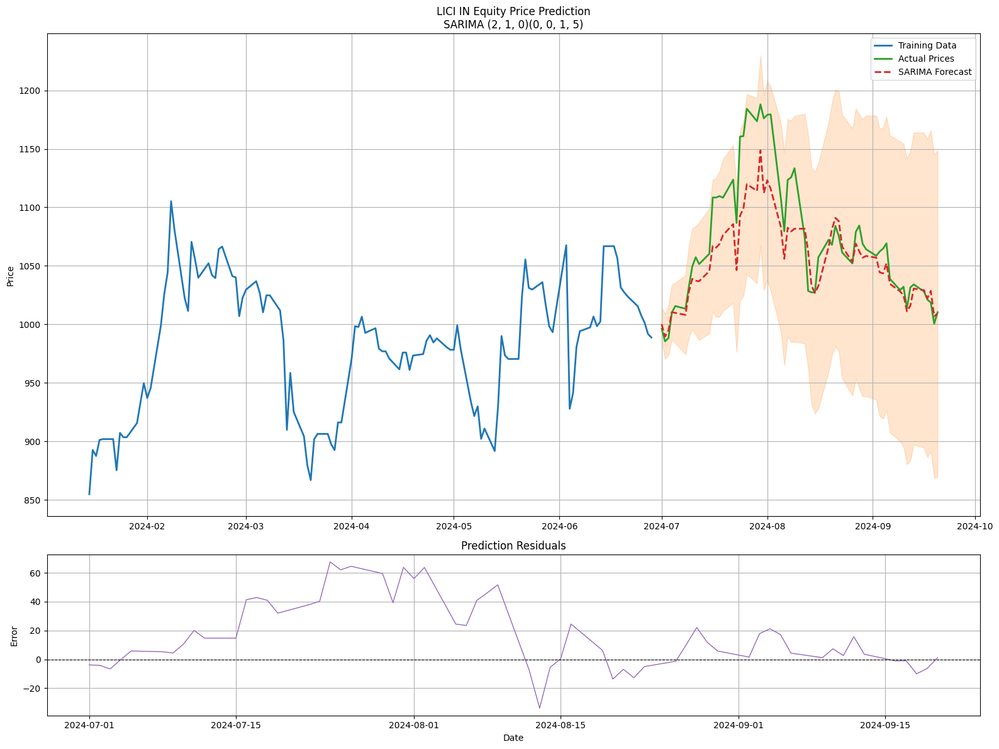


Best model:  ARIMA(2,1,2)(1,0,0)[5] intercept
Total fit time: 163.130 seconds

Best model:  ARIMA(2,1,2)(1,0,0)[5] intercept
Total fit time: 160.180 seconds

Best model:  ARIMA(2,1,2)(1,0,0)[5] intercept
Total fit time: 159.427 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


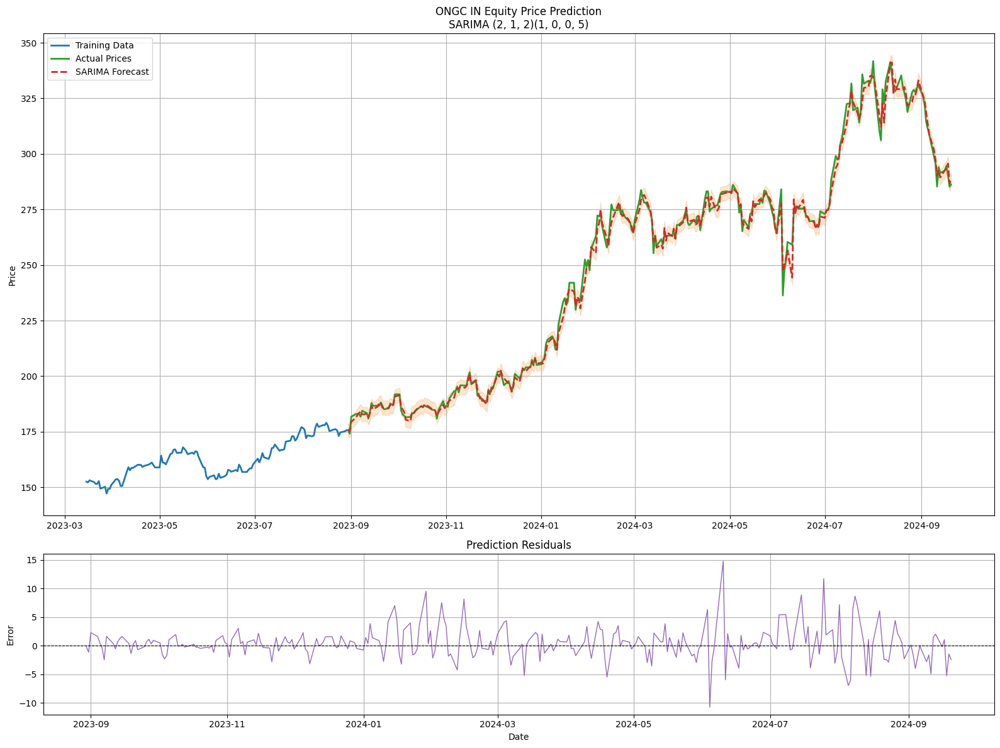


Best model:  ARIMA(2,0,1)(0,0,1)[5] intercept
Total fit time: 451.167 seconds

Best model:  ARIMA(2,0,1)(0,0,1)[5] intercept
Total fit time: 450.755 seconds

Best model:  ARIMA(2,0,1)(0,0,1)[5] intercept
Total fit time: 449.448 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


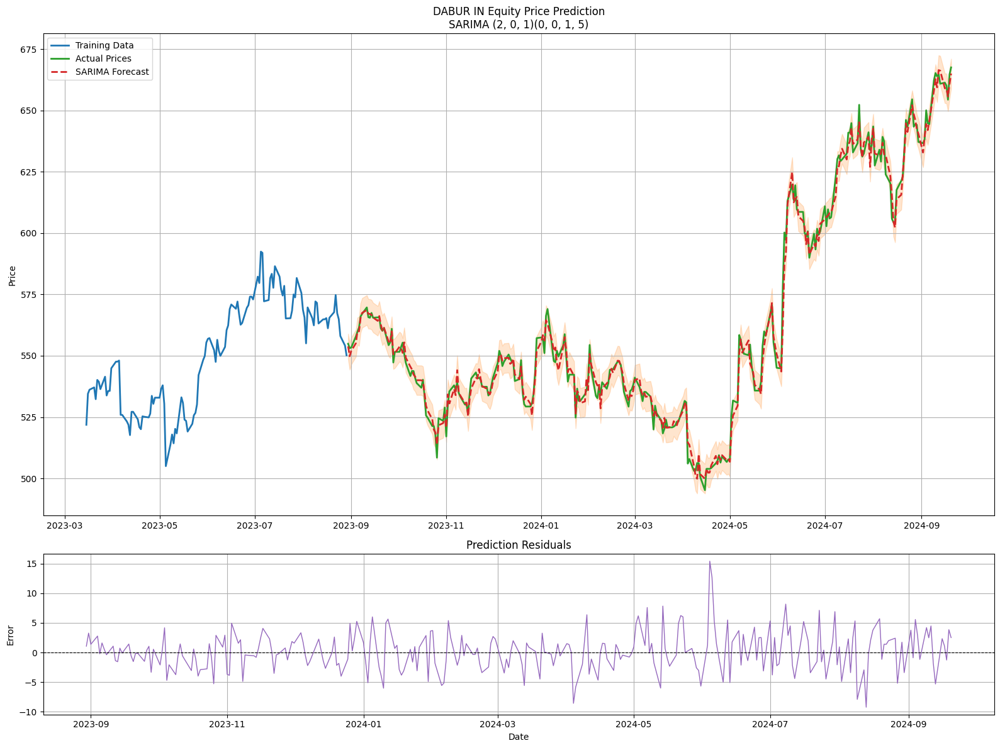


Best model:  ARIMA(0,1,0)(0,0,0)[5] intercept
Total fit time: 182.126 seconds

Best model:  ARIMA(0,1,0)(0,0,0)[5] intercept
Total fit time: 191.155 seconds

Best model:  ARIMA(0,1,0)(0,0,0)[5] intercept
Total fit time: 195.387 seconds


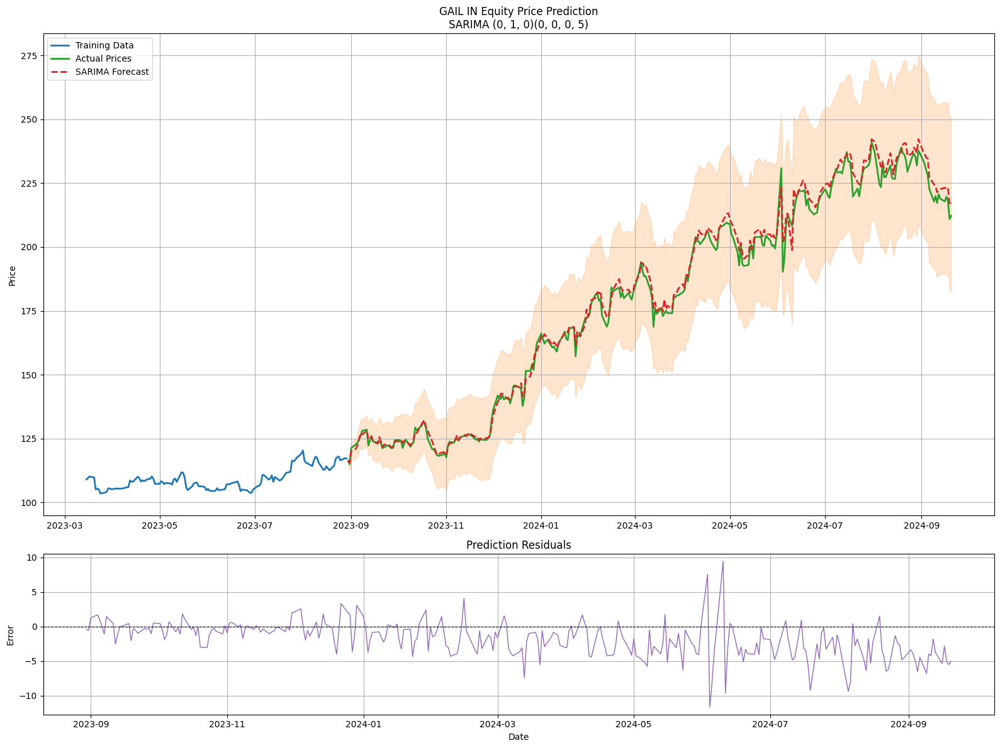


Best model:  ARIMA(0,1,0)(0,0,1)[5] intercept
Total fit time: 225.779 seconds

Best model:  ARIMA(0,1,0)(0,0,1)[5] intercept
Total fit time: 221.670 seconds

Best model:  ARIMA(0,1,0)(0,0,1)[5] intercept
Total fit time: 219.180 seconds


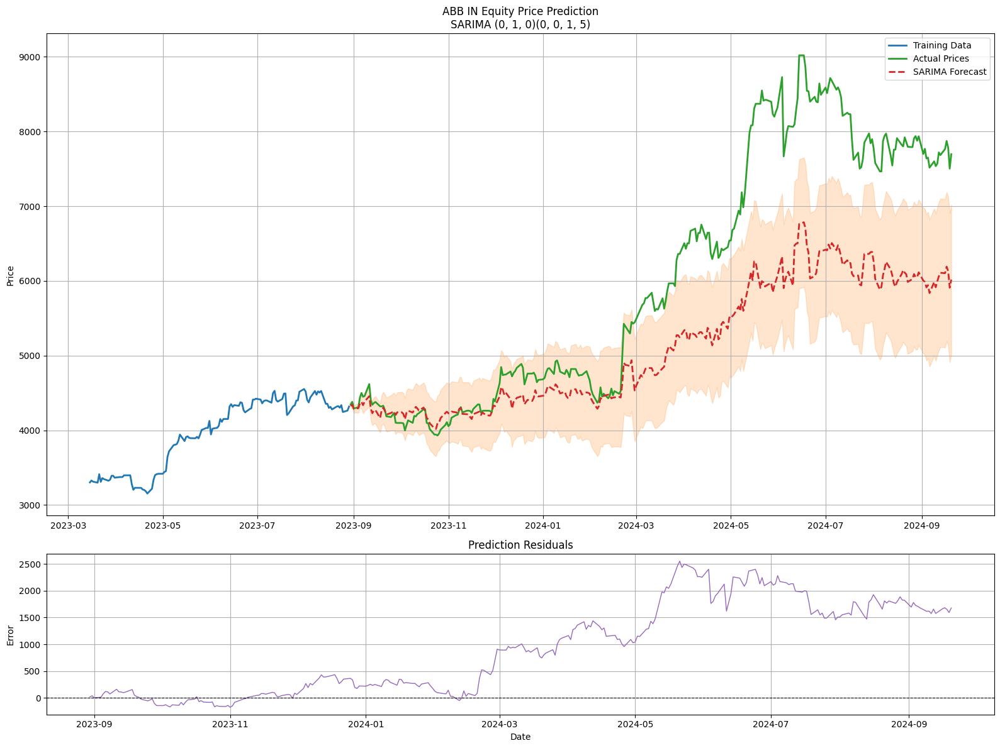


Best model:  ARIMA(2,1,3)(0,0,0)[5] intercept
Total fit time: 211.095 seconds

Best model:  ARIMA(2,1,3)(0,0,0)[5] intercept
Total fit time: 213.653 seconds

Best model:  ARIMA(2,1,3)(0,0,0)[5] intercept
Total fit time: 215.184 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


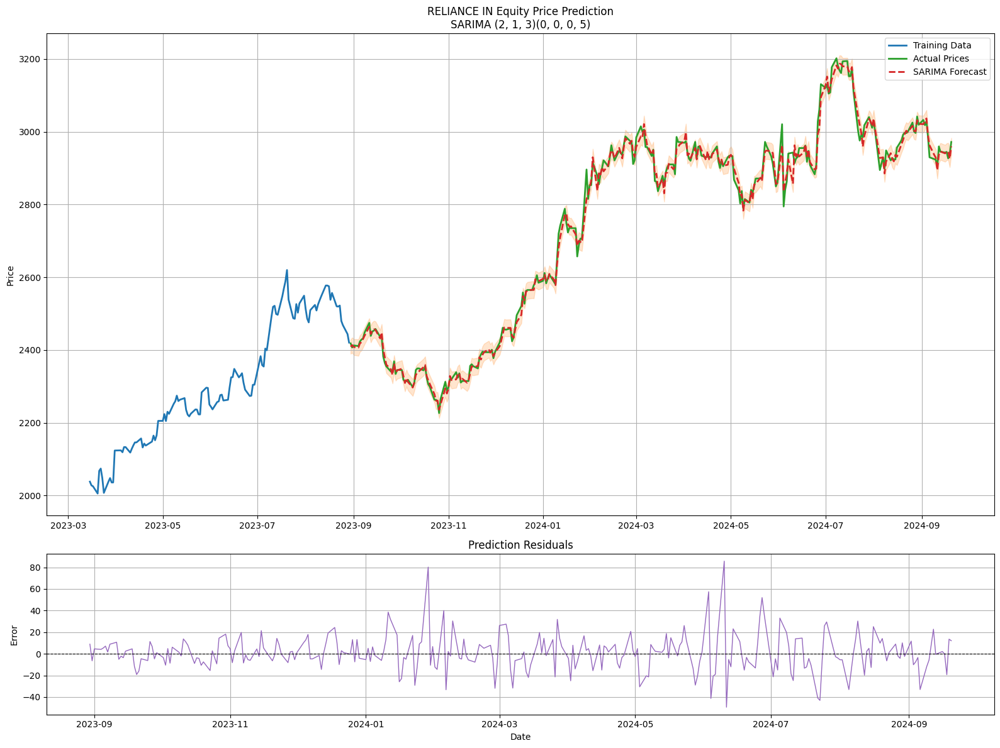


Best model:  ARIMA(2,1,1)(0,0,0)[5] intercept
Total fit time: 172.489 seconds

Best model:  ARIMA(2,1,1)(0,0,0)[5] intercept
Total fit time: 172.313 seconds

Best model:  ARIMA(2,1,1)(0,0,0)[5] intercept
Total fit time: 171.031 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


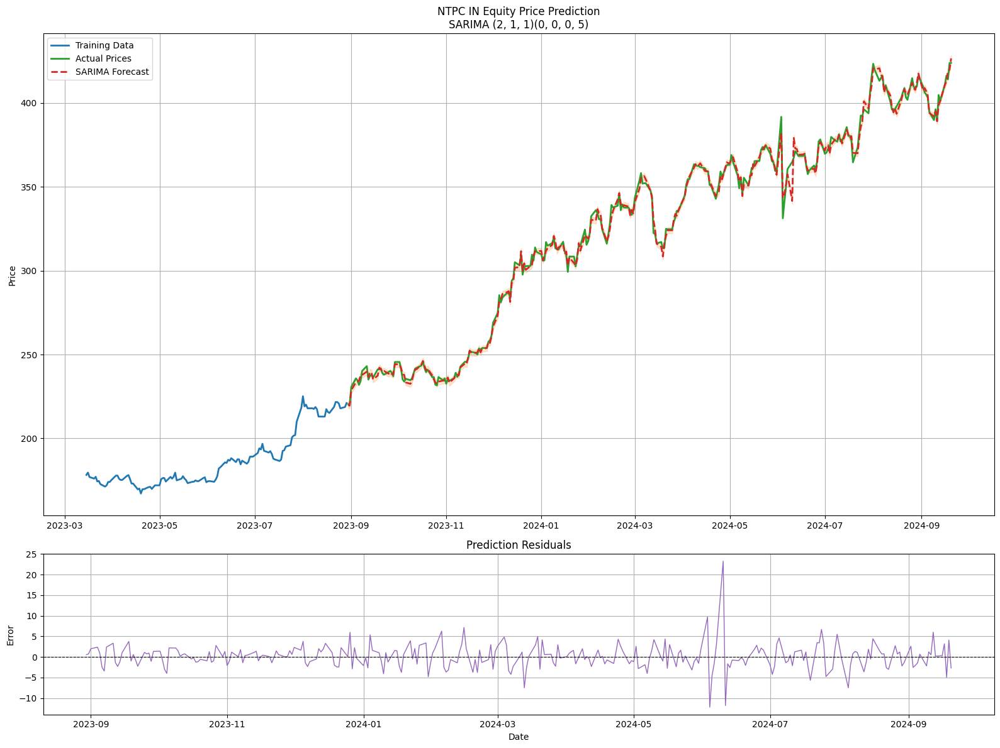


Best model:  ARIMA(2,1,0)(1,0,0)[5] intercept
Total fit time: 161.355 seconds

Best model:  ARIMA(2,1,0)(1,0,0)[5] intercept
Total fit time: 161.260 seconds

Best model:  ARIMA(2,1,0)(1,0,0)[5] intercept
Total fit time: 160.750 seconds


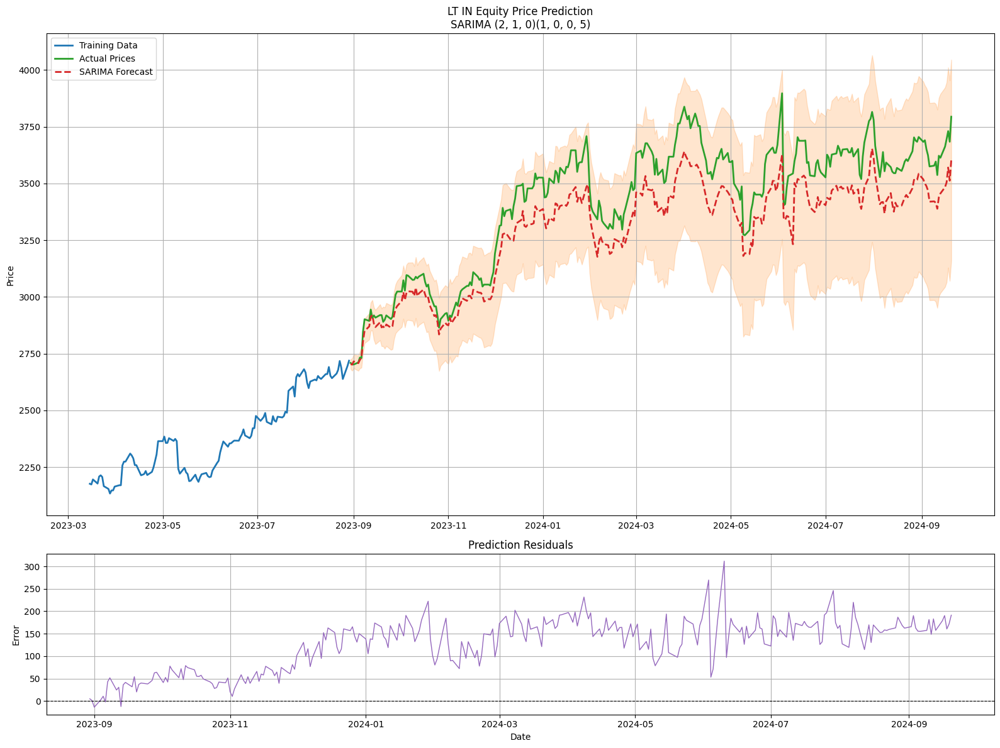


Best model:  ARIMA(1,1,0)(0,0,0)[5] intercept
Total fit time: 196.717 seconds

Best model:  ARIMA(1,1,0)(0,0,0)[5] intercept
Total fit time: 212.116 seconds

Best model:  ARIMA(1,1,0)(0,0,0)[5] intercept
Total fit time: 192.265 seconds


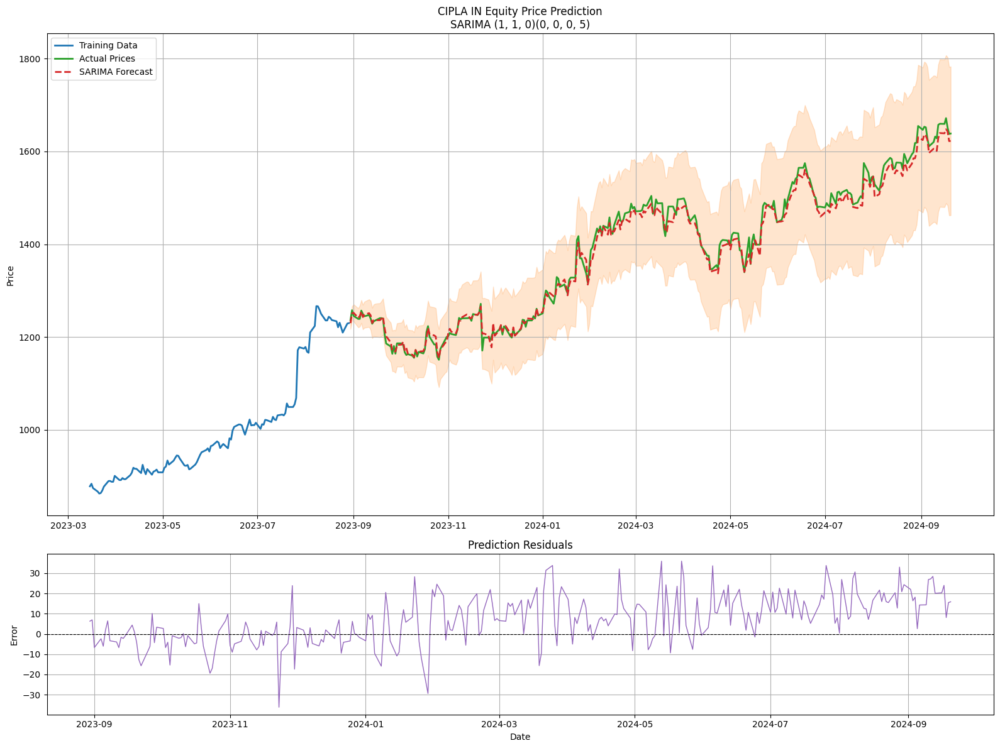


Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 202.475 seconds

Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 201.392 seconds

Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 202.865 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


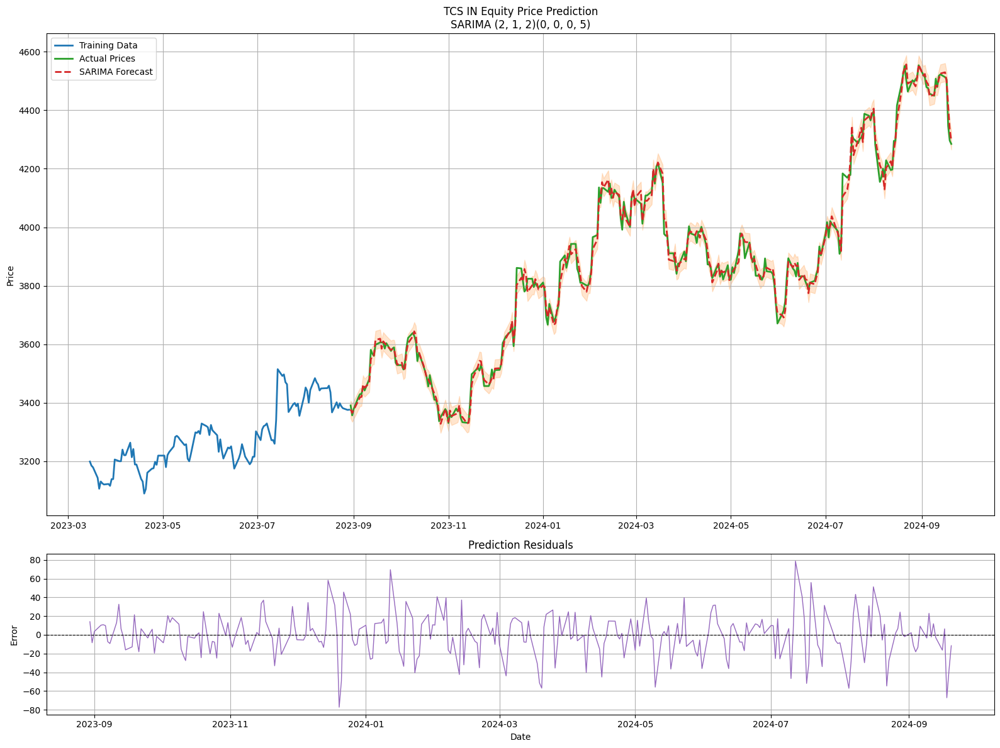


Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 171.791 seconds

Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 178.568 seconds

Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 177.761 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


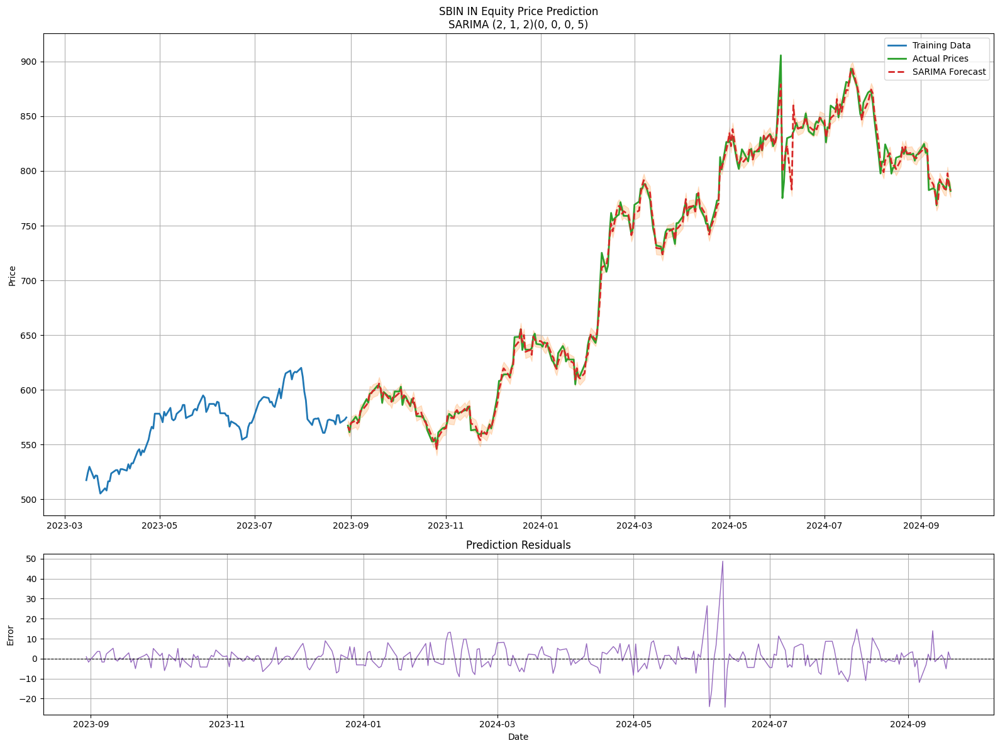


Best model:  ARIMA(1,1,0)(0,0,0)[5] intercept
Total fit time: 153.922 seconds

Best model:  ARIMA(1,1,0)(0,0,0)[5] intercept
Total fit time: 154.854 seconds

Best model:  ARIMA(1,1,0)(0,0,0)[5] intercept
Total fit time: 154.141 seconds


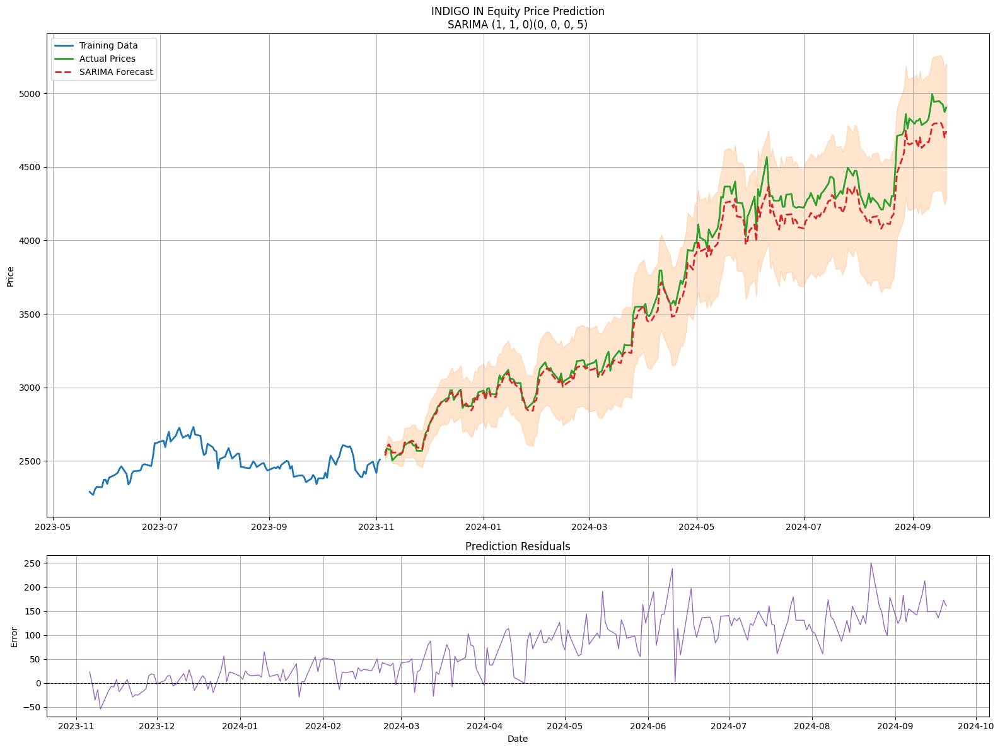


Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 187.588 seconds

Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 187.910 seconds

Best model:  ARIMA(2,1,2)(0,0,0)[5] intercept
Total fit time: 201.479 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


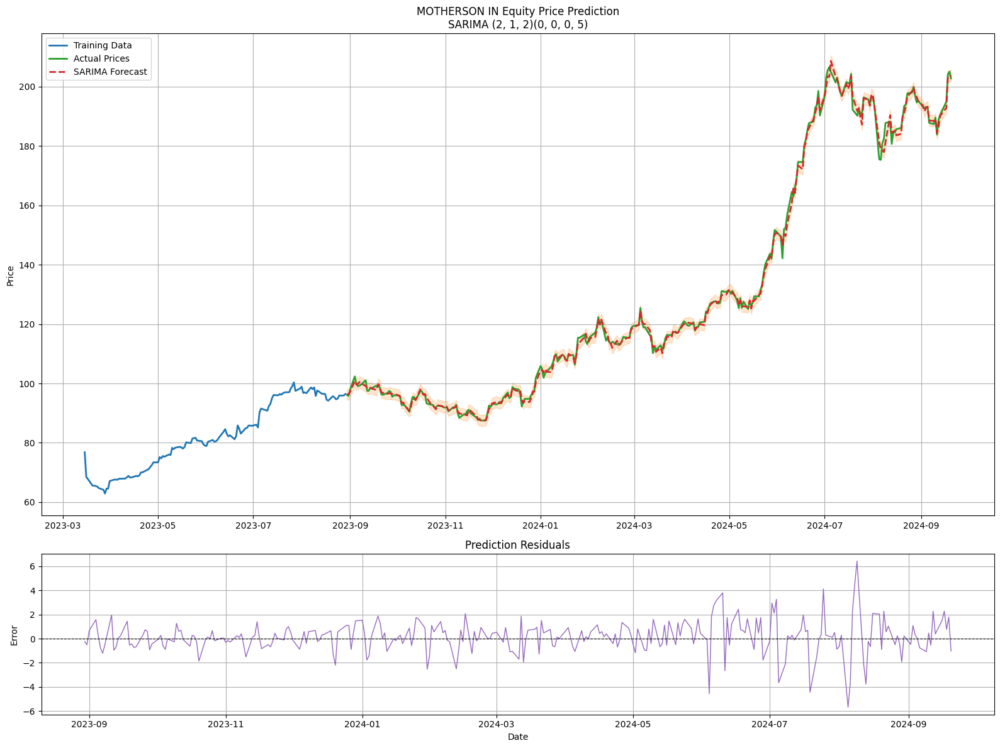


Best model:  ARIMA(2,1,3)(0,0,0)[5] intercept
Total fit time: 238.630 seconds

Best model:  ARIMA(2,1,3)(0,0,0)[5] intercept
Total fit time: 242.383 seconds

Best model:  ARIMA(2,1,3)(0,0,0)[5] intercept
Total fit time: 222.906 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


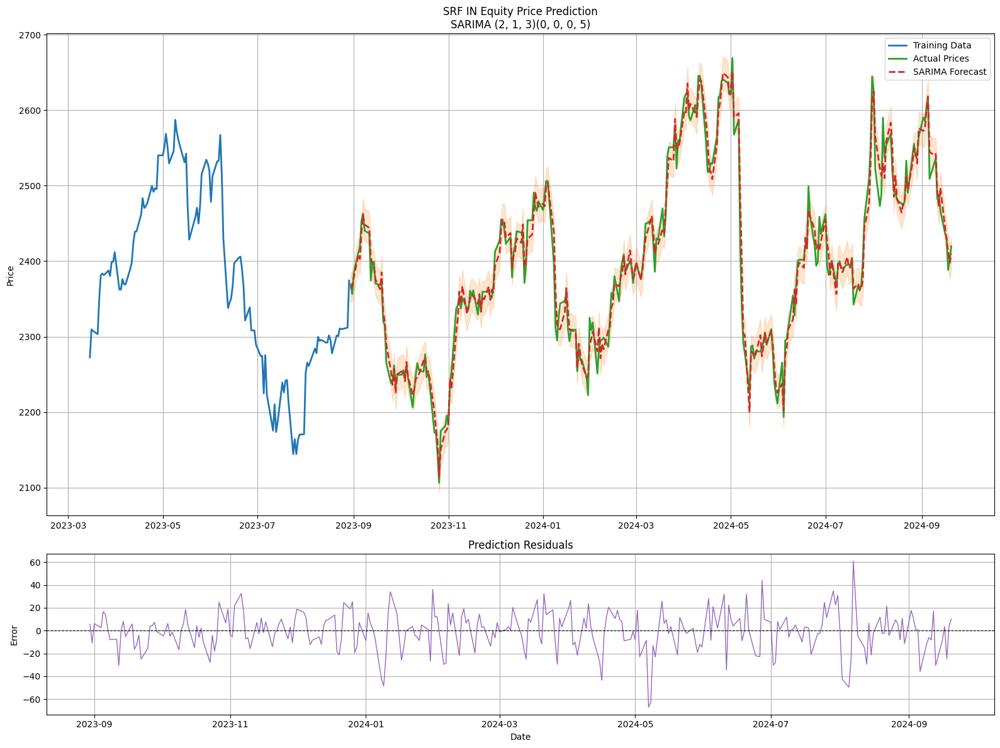


Best model:  ARIMA(1,1,2)(1,0,1)[5] intercept
Total fit time: 128.313 seconds

Best model:  ARIMA(1,1,2)(1,0,1)[5] intercept
Total fit time: 127.452 seconds

Best model:  ARIMA(1,1,2)(1,0,1)[5] intercept
Total fit time: 134.309 seconds


/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


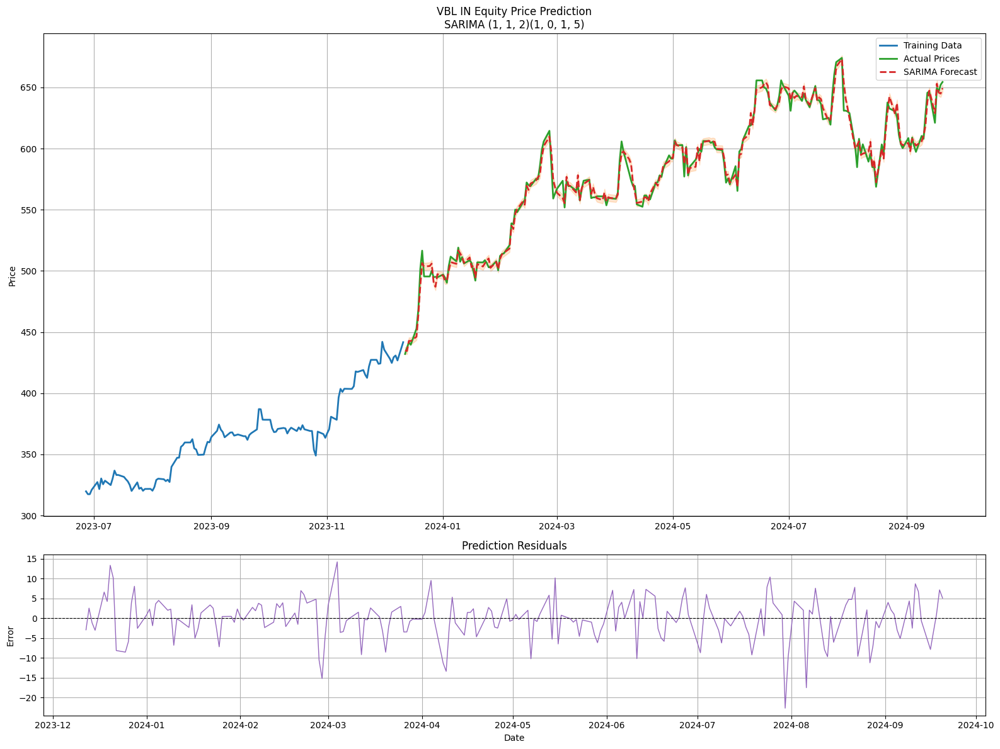

+----------------------+--------------------+--------------------+---------------------+---------------------+------------------------+
|       Company        |        MAE         |        RMSE        |      MAPE (%)       |         R²          | Direction Accuracy (%) |
+----------------------+--------------------+--------------------+---------------------+---------------------+------------------------+
|   ZOMATO IN Equity   | 18.018841346160322 | 20.92276979159199  |  7.330319669331517  | 0.5815183701241475  |         73.75          |
|  SBICARD IN Equity   | 3.450543485215531  | 4.618781731585107  | 0.47191832864650707 | 0.9705525428719389  |   71.55172413793103    |
| TATACONSUM IN Equity | 5.182732882344389  | 6.909174088191588  | 0.48086893749298804 | 0.9966382490227249  |   75.09025270758123    |
|    VEDL IN Equity    | 2.9879274582608657 | 4.107967914333247  | 0.8843444295868361  | 0.9981258469598233  |   69.67509025270758    |
|   DMART IN Equity    | 28.069674307241286 | 36

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import (mean_absolute_error,
                           mean_squared_error,
                           mean_absolute_percentage_error,
                           r2_score)
from tabulate import tabulate
from sklearn.preprocessing import MinMaxScaler

def enhanced_parameter_tuning(train_data):
    """Advanced parameter optimization with extended search space"""
    try:
        return auto_arima(
            train_data,
            seasonal=True,
            m=5,  # 5-day trading week seasonality
            stepwise=False,  # Enable full search
            suppress_warnings=True,
            error_action='ignore',
            maxiter=200,
            information_criterion='aic',
            trace=True,
            n_jobs=-1,
            test='adf',
            seasonal_test='ocsb',
            approximation=False,
            with_intercept=True
        )
    except Exception as e:
        print(f"Parameter optimization failed: {str(e)}")
        return None

def create_hybrid_features(series):
    """Create technical indicators as exogenous variables"""
    features = pd.DataFrame(index=series.index)
    features['MA_7'] = series.rolling(window=7).mean()
    features['MA_21'] = series.rolling(window=21).mean()
    features['Momentum'] = series.diff(5)
    features['Volatility'] = series.pct_change().rolling(5).std()
    return features.dropna()

def time_series_cv(model, train_data, periods=5):
    """Walk-forward time series cross-validation"""
    cv_scores = []
    test_size = len(train_data) // (periods + 1)

    for i in range(periods):
        split = -(test_size * (i + 1))
        train = train_data[:split]
        test = train_data[split:split+test_size]

        try:
            model.fit(train)
            forecast = model.predict(n_periods=test_size)
            cv_scores.append(mean_absolute_error(test, forecast))
        except:
            continue

    return np.mean(cv_scores)

# Load and prepare data
df = pd.read_csv('nifty_ohlc_data.csv', parse_dates=['date'])
# df = pd.read_csv(
#     'nifty_ohlc_data.csv',
#     parse_dates=['date'],
#     date_parser=lambda x: pd.to_datetime(x, format='%m-%d-%Y', errors='coerce')
# )

df[['open', 'high', 'low']] = df[['open', 'high', 'low']].ffill()

# df[['open', 'high', 'low']] = df[['open', 'high', 'low']].fillna(method='ffill')

companies = df['security'].unique()
error_table = []

for company in companies:
    try:
        company_data = df[df['security'] == company].sort_values('date')
        if len(company_data) < 250:  # Minimum 1 year of daily data
            print(f"Skipping {company}: Insufficient data ({len(company_data)} records)")
            continue

        # # Prepare series with technical features
        # prices = company_data.set_index('date')['close'].asfreq('B')
        # exog_features = create_hybrid_features(prices).ffill()
        # prices = prices.ffill()

        # Prepare series with technical features
        prices = company_data.set_index('date')['close'].asfreq('B').ffill()
        exog_features = create_hybrid_features(prices).ffill()

        # Align prices and features
        prices = prices.loc[exog_features.index]


        # Train-test split
        split = int(len(prices) * 0.9)
        train, test = prices.iloc[:split], prices.iloc[split:]
        exog_train, exog_test = exog_features.iloc[:split], exog_features.iloc[split:]

        # Parameter optimization with cross-validation
        best_score = np.inf
        best_model = None

        for _ in range(3):  # Multiple optimization attempts
            arima_model = enhanced_parameter_tuning(train)
            if arima_model is None:
                continue

            current_score = time_series_cv(arima_model, train)
            if current_score < best_score:
                best_score = current_score
                best_model = arima_model

        if best_model is None:
            print(f"Failed to find suitable model for {company}")
            continue

        # Final model training
        final_model = SARIMAX(train,
                            order=best_model.order,
                            seasonal_order=best_model.seasonal_order,
                            exog=exog_train,
                            enforce_stationarity=True,
                            enforce_invertibility=True)
        results = final_model.fit(disp=0)

        # Forecasting with exogenous variables
        forecast = results.get_forecast(steps=len(test), exog=exog_test)
        preds = forecast.predicted_mean
        conf_int = forecast.conf_int()

        # Enhanced error metrics
        metrics = {
            'MAE': mean_absolute_error(test, preds),
            'RMSE': np.sqrt(mean_squared_error(test, preds)),
            'MAPE': mean_absolute_percentage_error(test, preds) * 100,
            'R2': r2_score(test, preds),
            'DA': np.mean(np.sign(test.diff().dropna()) == np.sign(preds.diff().dropna())) * 100
        }

        error_table.append([company,
                          metrics['MAE'],
                          metrics['RMSE'],
                          metrics['MAPE'],
                          metrics['R2'],
                          metrics['DA']])

        # Advanced visualization
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 12), gridspec_kw={'height_ratios': [3, 1]})

        # Price plot
        ax1.plot(train[-120:], label='Training Data', color='#1f77b4', linewidth=2)
        ax1.plot(test, label='Actual Prices', color='#2ca02c', linewidth=2)
        ax1.plot(preds, label='SARIMA Forecast', linestyle='--', color='#d62728', linewidth=2)
        ax1.fill_between(conf_int.index,
                        conf_int.iloc[:, 0],
                        conf_int.iloc[:, 1],
                        color='#ff7f0e', alpha=0.2)
        ax1.set_title(f'{company} Price Prediction\nSARIMA {best_model.order}{best_model.seasonal_order}')
        ax1.set_ylabel('Price')
        ax1.legend()
        ax1.grid(True)

        # Residual plot
        residuals = test - preds
        ax2.plot(residuals, color='#9467bd', linewidth=1)
        ax2.axhline(0, color='k', linestyle='--', linewidth=0.8)
        ax2.set_title('Prediction Residuals')
        ax2.set_xlabel('Date')
        ax2.set_ylabel('Error')
        ax2.grid(True)

        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Failed for {company}: {str(e)}")
        continue

# Print comprehensive metrics
print(tabulate(error_table,
              headers=["Company", "MAE", "RMSE", "MAPE (%)", "R²", "Direction Accuracy (%)"],
              tablefmt="pretty",
              floatfmt=".2f"))